<a href="https://colab.research.google.com/github/Piyumi22/FYRP/blob/main/PV_Energy_Forecasting.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## 0.Importing the Libraries

In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import random

import matplotlib.pyplot as plt
import os

import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.offline as pyo

import os
import datetime

import IPython
import IPython.display

import tensorflow as tf


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


#1.EDA on weather data

we use the same EDA process which used to forecast wind speed except feature engineering

In [3]:
# Load the CSV file into a DataFrame
file_path = '/content/drive/MyDrive/FYRP/Data Files/weather_data.csv'
weather_data = pd.read_csv(file_path)


In [4]:
data=weather_data.copy()

##1.1data preprocessing

**Sort and remove duplicates**

In [5]:
data['DateTime'] = pd.to_datetime(data['time'], format='%Y-%m-%d %H:%M:%S')  # Convert 'time' column to datetime format.
data = data.drop_duplicates(subset='DateTime')  # Drop duplicates of DateTime.
data.set_index('DateTime', inplace=True)  # Set 'DateTime' as the index.
data = data.sort_index()  # Sort data according to index.
data.pop ('Unnamed: 0') #pop removes feature from dataframe
data.pop ('time')

DateTime
2015-01-21 00:00:00    2015-01-21 00:00:00
2015-01-21 01:00:00    2015-01-21 01:00:00
2015-01-21 02:00:00    2015-01-21 02:00:00
2015-01-21 03:00:00    2015-01-21 03:00:00
2015-01-21 04:00:00    2015-01-21 04:00:00
                              ...         
2020-02-29 19:00:00    2020-02-29 19:00:00
2020-02-29 20:00:00    2020-02-29 20:00:00
2020-02-29 21:00:00    2020-02-29 21:00:00
2020-02-29 22:00:00    2020-02-29 22:00:00
2020-02-29 23:00:00    2020-02-29 23:00:00
Name: time, Length: 44784, dtype: object

# Feature engineering
-remove some specific features; 'snow', 'wpgt', 'tsun', 'coco' has no value or just one year data.
'prcp' has many missing values and has less correlation between any of features.



In [6]:
import pandas as pd

features_to_remove = [ 'snow', 'wpgt', 'tsun', 'coco','prcp']#  list of features to remove

# Double-check that features exist in the DataFrame
for feature in features_to_remove:
    if feature not in data.columns:
        print(f"Warning: Feature '{feature}' not found in DataFrame.")

data = data.drop(features_to_remove, axis=1)# Drop the specified features

###**fill missing values**

In [7]:
#fill features with last non nan value or prev non nan value
data.fillna(method='ffill', inplace=True)
# Alternatively, use the fillna method with pad (which is equivalent to forward-fill)
data.fillna(method='pad', inplace=True)
print(data.isna().sum())

temp    0
dwpt    0
rhum    0
wdir    0
wspd    0
pres    0
dtype: int64


In [8]:
data.describe()

,temp,dwpt,rhum,wdir,wspd,pres
count,44784.000000,44784.000000,44784.000000,44784.000000,44784.000000,44784.000000
mean,18.506936,11.488378,66.534767,235.454917,8.925918,1015.725636
std,4.108456,5.696192,17.213318,98.987869,6.566739,3.568441
min,3.900000,-20.700000,4.000000,0.000000,0.000000,999.300000
25%,15.600000,8.900000,59.000000,180.000000,5.400000,1013.200000
50%,18.300000,12.300000,70.000000,280.000000,9.400000,1015.400000
75%,21.100000,15.600000,78.000000,310.000000,13.000000,1018.000000
max,37.800000,22.900000,100.000000,360.000000,59.400000,1032.500000


In [9]:
data

,temp,dwpt,rhum,wdir,wspd,pres
DateTime,,,,,,
2015-01-21 00:00:00,16.1,10.6,70.0,220.0,7.6,1014.3
2015-01-21 01:00:00,15.6,10.6,72.0,270.0,13.0,1014.3
2015-01-21 02:00:00,15.0,10.6,75.0,270.0,9.4,1014.4
2015-01-21 03:00:00,15.0,10.6,75.0,230.0,7.6,1014.8
2015-01-21 04:00:00,15.0,10.6,75.0,230.0,0.0,1015.0
...,...,...,...,...,...,...
2020-02-29 19:00:00,18.9,13.3,70.0,210.0,16.6,1019.6
2020-02-29 20:00:00,19.4,14.0,71.0,210.0,14.8,1019.1
2020-02-29 21:00:00,18.9,14.0,73.0,220.0,16.6,1018.3


###**Wind**


wdir (deg)—gives the wind direction in units of degrees. Angles do not make good model inputs: 360° and 0° should be close to each other and wrap around smoothly. Direction shouldn't matter if the wind is not blowing.

the distribution of wind data;

In [10]:
data['wspd'].max()

59.4

Text(0, 0.5, 'Wind speed [m/s]')

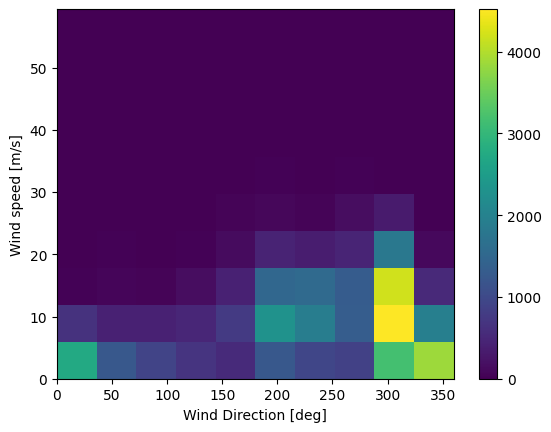

In [11]:
plt.hist2d(data['wdir'], data['wspd'] )
plt.colorbar()
plt.xlabel('Wind Direction [deg]')
plt.ylabel('Wind speed [m/s]')

convert the wind direction and velocity columns to a wind vector:

In [12]:
wspd = data.pop('wspd')

# Convert to radians.
wd_rad = data.pop('wdir')*np.pi / 180 #pop remove values from data

# Calculate the wind x and y components.
data['Wx'] = wspd*np.cos(wd_rad)
data['Wy'] = wspd*np.sin(wd_rad)

The distribution of wind vectors

(-51.44190898479566, 30.57069675359067, -51.013041606032374, 34.16558216310642)

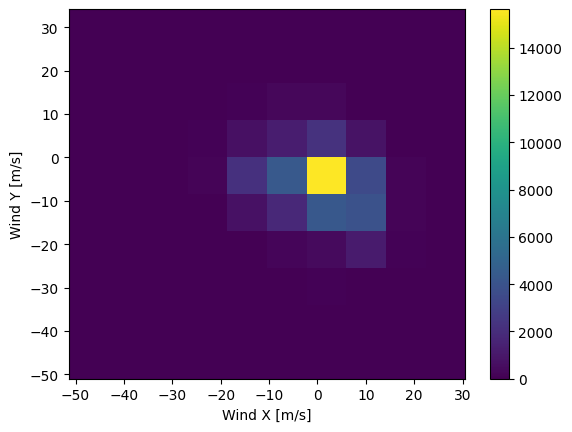

In [13]:
plt.hist2d(data['Wx'], data['Wy'])
plt.colorbar()
plt.xlabel('Wind X [m/s]')
plt.ylabel('Wind Y [m/s]')
ax = plt.gca()
ax.axis('tight')

#Load PV data

In [14]:
# Load the CSV file into a DataFrame
file_path = '/content/drive/MyDrive/FYRP/Data Files/Preprocessed_PVEnergy_data.csv'
pv_data=pd.read_csv(file_path)
print(pv_data)

                     index  MeanPower            Date_Time
0      2015-02-01 00:00:00   0.000000  2015-02-01 00:00:00
1      2015-02-01 01:00:00   0.000000  2015-02-01 01:00:00
2      2015-02-01 02:00:00   0.000000  2015-02-01 02:00:00
3      2015-02-01 03:00:00   0.000000  2015-02-01 03:00:00
4      2015-02-01 04:00:00   0.000000  2015-02-01 04:00:00
...                    ...        ...                  ...
44515  2020-02-29 19:00:00   0.001033  2020-02-29 19:00:00
44516  2020-02-29 20:00:00   0.001019  2020-02-29 20:00:00
44517  2020-02-29 21:00:00   0.001021  2020-02-29 21:00:00
44518  2020-02-29 22:00:00   0.001021  2020-02-29 22:00:00
44519  2020-02-29 23:00:00   0.001019  2020-02-29 23:00:00

[44520 rows x 3 columns]


In [15]:
pv_data['Date_Time']=pd.to_datetime(pv_data['Date_Time']) #convert to datetime
#pv_data.set_index('Date_Time', inplace=True)
print(pv_data)

                     index  MeanPower           Date_Time
0      2015-02-01 00:00:00   0.000000 2015-02-01 00:00:00
1      2015-02-01 01:00:00   0.000000 2015-02-01 01:00:00
2      2015-02-01 02:00:00   0.000000 2015-02-01 02:00:00
3      2015-02-01 03:00:00   0.000000 2015-02-01 03:00:00
4      2015-02-01 04:00:00   0.000000 2015-02-01 04:00:00
...                    ...        ...                 ...
44515  2020-02-29 19:00:00   0.001033 2020-02-29 19:00:00
44516  2020-02-29 20:00:00   0.001019 2020-02-29 20:00:00
44517  2020-02-29 21:00:00   0.001021 2020-02-29 21:00:00
44518  2020-02-29 22:00:00   0.001021 2020-02-29 22:00:00
44519  2020-02-29 23:00:00   0.001019 2020-02-29 23:00:00

[44520 rows x 3 columns]


In [16]:
pv_data.set_index('Date_Time', inplace=True)  # Set 'Date_Time' as the index.
pv_data = pv_data.sort_index()  # Sort pv_data according to index.
print(pv_data)

                                   index  MeanPower
Date_Time                                          
2015-02-01 00:00:00  2015-02-01 00:00:00   0.000000
2015-02-01 01:00:00  2015-02-01 01:00:00   0.000000
2015-02-01 02:00:00  2015-02-01 02:00:00   0.000000
2015-02-01 03:00:00  2015-02-01 03:00:00   0.000000
2015-02-01 04:00:00  2015-02-01 04:00:00   0.000000
...                                  ...        ...
2020-02-29 19:00:00  2020-02-29 19:00:00   0.001033
2020-02-29 20:00:00  2020-02-29 20:00:00   0.001019
2020-02-29 21:00:00  2020-02-29 21:00:00   0.001021
2020-02-29 22:00:00  2020-02-29 22:00:00   0.001021
2020-02-29 23:00:00  2020-02-29 23:00:00   0.001019

[44520 rows x 2 columns]


In [17]:
print(data)

                     temp  dwpt  rhum    pres            Wx         Wy
DateTime                                                              
2015-01-21 00:00:00  16.1  10.6  70.0  1014.3 -5.821938e+00  -4.885186
2015-01-21 01:00:00  15.6  10.6  72.0  1014.3 -2.388061e-15 -13.000000
2015-01-21 02:00:00  15.0  10.6  75.0  1014.4 -1.726752e-15  -9.400000
2015-01-21 03:00:00  15.0  10.6  75.0  1014.8 -4.885186e+00  -5.821938
2015-01-21 04:00:00  15.0  10.6  75.0  1015.0 -0.000000e+00  -0.000000
...                   ...   ...   ...     ...           ...        ...
2020-02-29 19:00:00  18.9  13.3  70.0  1019.6 -1.437602e+01  -8.300000
2020-02-29 20:00:00  19.4  14.0  71.0  1019.1 -1.281718e+01  -7.400000
2020-02-29 21:00:00  18.9  14.0  73.0  1018.3 -1.271634e+01 -10.670274
2020-02-29 22:00:00  18.9  12.9  68.0  1017.8 -9.513257e+00 -11.337458
2020-02-29 23:00:00  18.3  12.3  68.0  1017.8 -9.513257e+00 -11.337458

[44784 rows x 6 columns]


**Merge data**

In [18]:
pv_data.pop('index')

Date_Time
2015-02-01 00:00:00    2015-02-01 00:00:00
2015-02-01 01:00:00    2015-02-01 01:00:00
2015-02-01 02:00:00    2015-02-01 02:00:00
2015-02-01 03:00:00    2015-02-01 03:00:00
2015-02-01 04:00:00    2015-02-01 04:00:00
                              ...         
2020-02-29 19:00:00    2020-02-29 19:00:00
2020-02-29 20:00:00    2020-02-29 20:00:00
2020-02-29 21:00:00    2020-02-29 21:00:00
2020-02-29 22:00:00    2020-02-29 22:00:00
2020-02-29 23:00:00    2020-02-29 23:00:00
Name: index, Length: 44520, dtype: object

In [19]:
# Extract the 'Value' column from data
#value_column = pv_data[['MeanPower']]
# Concatenate pv_data and the extracted 'Value' column along the columns (axis=1)
merged_df = pd.concat([data, pv_data], axis=1)
#merged_df.reset_index(inplace=True)
print(merged_df)

                     temp  dwpt  rhum    pres            Wx         Wy  \
2015-01-21 00:00:00  16.1  10.6  70.0  1014.3 -5.821938e+00  -4.885186   
2015-01-21 01:00:00  15.6  10.6  72.0  1014.3 -2.388061e-15 -13.000000   
2015-01-21 02:00:00  15.0  10.6  75.0  1014.4 -1.726752e-15  -9.400000   
2015-01-21 03:00:00  15.0  10.6  75.0  1014.8 -4.885186e+00  -5.821938   
2015-01-21 04:00:00  15.0  10.6  75.0  1015.0 -0.000000e+00  -0.000000   
...                   ...   ...   ...     ...           ...        ...   
2020-02-29 19:00:00  18.9  13.3  70.0  1019.6 -1.437602e+01  -8.300000   
2020-02-29 20:00:00  19.4  14.0  71.0  1019.1 -1.281718e+01  -7.400000   
2020-02-29 21:00:00  18.9  14.0  73.0  1018.3 -1.271634e+01 -10.670274   
2020-02-29 22:00:00  18.9  12.9  68.0  1017.8 -9.513257e+00 -11.337458   
2020-02-29 23:00:00  18.3  12.3  68.0  1017.8 -9.513257e+00 -11.337458   

                     MeanPower  
2015-01-21 00:00:00        NaN  
2015-01-21 01:00:00        NaN  
2015-01-21 0

In [20]:
print(merged_df.isna().sum())

temp           0
dwpt           0
rhum           0
pres           0
Wx             0
Wy             0
MeanPower    264
dtype: int64


In [21]:
from google.colab import data_table
#data_table.DataTable(merged_df.tail(2000))
data_table.DataTable(merged_df)

,temp,dwpt,rhum,pres,Wx,Wy,MeanPower
2015-01-21 00:00:00,16.1,10.6,70.0,1014.3,-5.821938e+00,-4.885186,NaN
2015-01-21 01:00:00,15.6,10.6,72.0,1014.3,-2.388061e-15,-13.000000,NaN
2015-01-21 02:00:00,15.0,10.6,75.0,1014.4,-1.726752e-15,-9.400000,NaN
2015-01-21 03:00:00,15.0,10.6,75.0,1014.8,-4.885186e+00,-5.821938,NaN
2015-01-21 04:00:00,15.0,10.6,75.0,1015.0,-0.000000e+00,-0.000000,NaN
...,...,...,...,...,...,...,...
2020-02-29 19:00:00,18.9,13.3,70.0,1019.6,-1.437602e+01,-8.300000,0.001033
2020-02-29 20:00:00,19.4,14.0,71.0,1019.1,-1.281718e+01,-7.400000,0.001019
2020-02-29 21:00:00,18.9,14.0,73.0,1018.3,-1.271634e+01,-10.670274,0.001021
2020-02-29 22:00:00,18.9,12.9,68.0,1017.8,-9.513257e+00,-11.337458,0.001021


In [22]:
print(merged_df)

                     temp  dwpt  rhum    pres            Wx         Wy  \
2015-01-21 00:00:00  16.1  10.6  70.0  1014.3 -5.821938e+00  -4.885186   
2015-01-21 01:00:00  15.6  10.6  72.0  1014.3 -2.388061e-15 -13.000000   
2015-01-21 02:00:00  15.0  10.6  75.0  1014.4 -1.726752e-15  -9.400000   
2015-01-21 03:00:00  15.0  10.6  75.0  1014.8 -4.885186e+00  -5.821938   
2015-01-21 04:00:00  15.0  10.6  75.0  1015.0 -0.000000e+00  -0.000000   
...                   ...   ...   ...     ...           ...        ...   
2020-02-29 19:00:00  18.9  13.3  70.0  1019.6 -1.437602e+01  -8.300000   
2020-02-29 20:00:00  19.4  14.0  71.0  1019.1 -1.281718e+01  -7.400000   
2020-02-29 21:00:00  18.9  14.0  73.0  1018.3 -1.271634e+01 -10.670274   
2020-02-29 22:00:00  18.9  12.9  68.0  1017.8 -9.513257e+00 -11.337458   
2020-02-29 23:00:00  18.3  12.3  68.0  1017.8 -9.513257e+00 -11.337458   

                     MeanPower  
2015-01-21 00:00:00        NaN  
2015-01-21 01:00:00        NaN  
2015-01-21 0

In [23]:
merged_df['Due']=merged_df.index

In [24]:

# Specify the start time
start_time = '2016-01-01 00:00:00'
# Filter the DataFrame to include only rows with DateTime greater than or equal to the start time
merged_df = merged_df[merged_df['Due'] >= start_time]

# Display the updated DataFrame
print(merged_df)


                     temp  dwpt  rhum    pres         Wx         Wy  \
2016-01-01 00:00:00  16.1   5.1  48.0  1017.6   7.199221  -8.579698   
2016-01-01 01:00:00  15.6   5.5  51.0  1018.1   7.200818  -6.042204   
2016-01-01 02:00:00  14.4   4.4  51.0  1018.3   7.141664  -2.599353   
2016-01-01 03:00:00  13.9   4.5  53.0  1018.7   0.000000  -0.000000   
2016-01-01 04:00:00  13.3   4.4  55.0  1018.7   0.000000  -0.000000   
...                   ...   ...   ...     ...        ...        ...   
2020-02-29 19:00:00  18.9  13.3  70.0  1019.6 -14.376022  -8.300000   
2020-02-29 20:00:00  19.4  14.0  71.0  1019.1 -12.817176  -7.400000   
2020-02-29 21:00:00  18.9  14.0  73.0  1018.3 -12.716338 -10.670274   
2020-02-29 22:00:00  18.9  12.9  68.0  1017.8  -9.513257 -11.337458   
2020-02-29 23:00:00  18.3  12.3  68.0  1017.8  -9.513257 -11.337458   

                     MeanPower                 Due  
2016-01-01 00:00:00   0.000609 2016-01-01 00:00:00  
2016-01-01 01:00:00   0.000612 2016-01-01

In [25]:
print(merged_df.isna().sum())

temp         0
dwpt         0
rhum         0
pres         0
Wx           0
Wy           0
MeanPower    0
Due          0
dtype: int64


In [26]:
print(merged_df[merged_df.isna().any(axis=1)])

Empty DataFrame
Columns: [temp, dwpt, rhum, pres, Wx, Wy, MeanPower, Due]
Index: []


In [27]:
#fill features with last non nan value or prev non nan value
merged_df.fillna(method='ffill', inplace=True)
# Alternatively, use the fillna method with pad (which is equivalent to forward-fill)
merged_df.fillna(method='pad', inplace=True)

<ipython-input-27-c3355472ca0c>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-27-c3355472ca0c>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [28]:
print(merged_df.isna().sum())

temp         0
dwpt         0
rhum         0
pres         0
Wx           0
Wy           0
MeanPower    0
Due          0
dtype: int64


In [29]:
df=merged_df.copy()

In [30]:
df.pop('Due')

2016-01-01 00:00:00   2016-01-01 00:00:00
2016-01-01 01:00:00   2016-01-01 01:00:00
2016-01-01 02:00:00   2016-01-01 02:00:00
2016-01-01 03:00:00   2016-01-01 03:00:00
2016-01-01 04:00:00   2016-01-01 04:00:00
                              ...        
2020-02-29 19:00:00   2020-02-29 19:00:00
2020-02-29 20:00:00   2020-02-29 20:00:00
2020-02-29 21:00:00   2020-02-29 21:00:00
2020-02-29 22:00:00   2020-02-29 22:00:00
2020-02-29 23:00:00   2020-02-29 23:00:00
Freq: H, Name: Due, Length: 36504, dtype: datetime64[ns]

In [31]:
print(df.isna().sum())

temp         0
dwpt         0
rhum         0
pres         0
Wx           0
Wy           0
MeanPower    0
dtype: int64


## multiply

#**Time**

Similarly, the Date Time column is very useful, but not in this string form. Start by converting it to seconds:

In [32]:
timestamp_s = df.index.map(pd.Timestamp.timestamp)

the time in seconds is not a useful model input. Being weather data, it has clear daily and yearly periodicity.

get usable signals by using sine and cosine transforms to clear "Time of day" and "Time of year" signals:

In [33]:
day = 24*60*60
year = (365.2425)*day

df['Day sin'] = np.sin(timestamp_s * (2 * np.pi / day))
df['Day cos'] = np.cos(timestamp_s * (2 * np.pi / day))
df['Year sin'] = np.sin(timestamp_s * (2 * np.pi / year))
df['Year cos'] = np.cos(timestamp_s * (2 * np.pi / year))

Text(0.5, 1.0, 'Time of day signal')

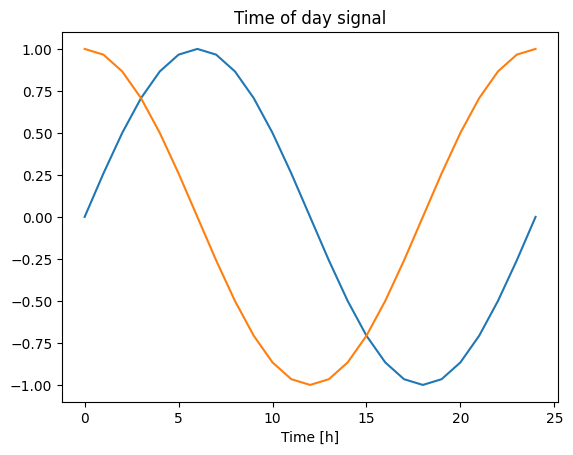

In [34]:
plt.plot(np.array(df['Day sin'])[:25])
plt.plot(np.array(df['Day cos'])[:25])
plt.xlabel('Time [h]')
plt.title('Time of day signal')

Text(0.5, 1.0, 'Time of Year signal')

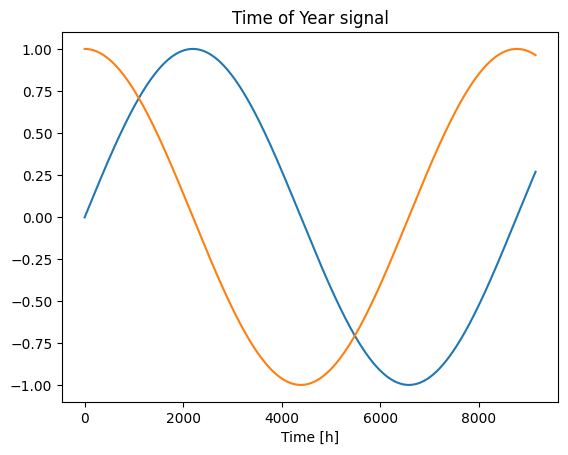

In [35]:
plt.plot(np.array(df['Year sin'])[:25*366])
plt.plot(np.array(df['Year cos'])[:25*366])
plt.xlabel('Time [h]')
plt.title('Time of Year signal')

In [36]:
df.describe()

,temp,dwpt,rhum,pres,Wx,Wy,MeanPower,Day sin,Day cos,Year sin,Year cos
count,36504.000000,36504.000000,36504.000000,36504.000000,36504.000000,36504.000000,36504.000000,3.650400e+04,3.650400e+04,36504.000000,36504.000000
mean,18.260339,11.446921,67.377794,1015.908500,0.382041,-4.761333,0.186364,6.451921e-15,7.068152e-16,0.018531,0.032873
std,4.039248,5.638258,17.281972,3.619935,7.428144,6.895336,0.267650,7.071165e-01,7.071165e-01,0.700839,0.712340
min,3.900000,-20.700000,4.000000,999.300000,-51.441909,-51.013042,0.000548,-1.000000e+00,-1.000000e+00,-1.000000,-1.000000
25%,15.600000,8.900000,60.000000,1013.400000,-3.800000,-9.513257,0.001053,-7.071068e-01,-7.071068e-01,-0.683866,-0.683947
50%,18.300000,12.300000,70.000000,1015.600000,0.000000,-3.800000,0.004421,1.819646e-14,-4.979055e-16,0.056986,0.064498
75%,21.100000,15.500000,79.000000,1018.200000,5.600000,0.000000,0.345239,7.071068e-01,7.071068e-01,0.705978,0.747522
max,37.800000,22.900000,100.000000,1032.500000,29.011851,34.165582,0.930721,1.000000e+00,1.000000e+00,1.000000,1.000000


#3.split the data

use a (70%, 20%, 10%) split for the training, validation, and test sets

In [37]:
#use a (70%, 20%, 10%) split for the training, validation, and test sets
column_indices = {name: i for i, name in enumerate(df.columns)}

n = len(df)
train_df = df[0:int(n*0.7)]
val_df = df[int(n*0.7):int(n*0.9)]
test_df = df[int(n*0.9):]

num_features = df.shape[1]
print(f"no of features: {num_features}")
# Print the shape of the training, validation, and test sets
print(f"train data shape: {train_df.shape}")
print(f"val data shape: {val_df.shape}")
print(f"test data shape: {test_df.shape}")

train_df

no of features: 11
train data shape: (25552, 11)
val data shape: (7301, 11)
test data shape: (3651, 11)


,temp,dwpt,rhum,pres,Wx,Wy,MeanPower,Day sin,Day cos,Year sin,Year cos
2016-01-01 00:00:00,16.1,5.1,48.0,1017.6,7.199221,-8.579698,0.000609,-1.407890e-12,1.000000,-0.002666,0.999996
2016-01-01 01:00:00,15.6,5.5,51.0,1018.1,7.200818,-6.042204,0.000612,2.588190e-01,0.965926,-0.001950,0.999998
2016-01-01 02:00:00,14.4,4.4,51.0,1018.3,7.141664,-2.599353,0.000604,5.000000e-01,0.866025,-0.001233,0.999999
2016-01-01 03:00:00,13.9,4.5,53.0,1018.7,0.000000,-0.000000,0.000613,7.071068e-01,0.707107,-0.000516,1.000000
2016-01-01 04:00:00,13.3,4.4,55.0,1018.7,0.000000,-0.000000,0.000608,8.660254e-01,0.500000,0.000201,1.000000
...,...,...,...,...,...,...,...,...,...,...,...
2018-11-30 11:00:00,16.1,11.7,75.0,1011.9,8.858322,-24.338039,0.330398,2.588190e-01,-0.965926,-0.514636,0.857409
2018-11-30 12:00:00,16.7,11.2,70.0,1011.8,5.061898,-13.907451,0.362913,2.190867e-12,-1.000000,-0.514021,0.857777
2018-11-30 13:00:00,16.1,11.7,75.0,1012.2,2.882560,-16.347809,0.367754,-2.588190e-01,-0.965926,-0.513406,0.858146
2018-11-30 14:00:00,15.6,11.8,78.0,1013.0,4.446262,-12.216004,0.308947,-5.000000e-01,-0.866025,-0.512791,0.858513


In [38]:
val_df

,temp,dwpt,rhum,pres,Wx,Wy,MeanPower,Day sin,Day cos,Year sin,Year cos
2018-11-30 16:00:00,16.1,11.7,75.0,1014.4,5.061898e+00,-13.907451,0.025628,-0.866025,-5.000000e-01,-0.511560,0.859248
2018-11-30 17:00:00,17.2,12.1,72.0,1015.5,4.497488e+00,-25.506521,0.001135,-0.965926,-2.588190e-01,-0.510944,0.859614
2018-11-30 18:00:00,17.2,11.0,67.0,1016.0,3.872354e+00,-21.961213,0.001057,-1.000000,-4.754211e-12,-0.510327,0.859980
2018-11-30 19:00:00,17.8,11.6,67.0,1015.9,7.011413e+00,-19.263699,0.001042,-0.965926,2.588190e-01,-0.509711,0.860346
2018-11-30 20:00:00,18.9,11.2,61.0,1015.8,1.115000e+01,-19.312367,0.001045,-0.866025,5.000000e-01,-0.509094,0.860711
...,...,...,...,...,...,...,...,...,...,...,...
2019-09-30 16:00:00,17.8,9.4,58.0,1013.0,0.000000e+00,-0.000000,0.461662,-0.866025,-5.000000e-01,-0.999805,-0.019742
2019-09-30 17:00:00,18.9,9.9,56.0,1013.2,-0.000000e+00,-0.000000,0.222817,-0.965926,-2.588190e-01,-0.999819,-0.019026
2019-09-30 18:00:00,20.0,10.7,55.0,1013.1,-2.057407e-15,-11.200000,0.034418,-1.000000,-7.670840e-12,-0.999832,-0.018309
2019-09-30 19:00:00,21.1,11.1,53.0,1012.9,5.061898e+00,-13.907451,0.001329,-0.965926,2.588190e-01,-0.999845,-0.017593


In [39]:
test_df

,temp,dwpt,rhum,pres,Wx,Wy,MeanPower,Day sin,Day cos,Year sin,Year cos
2019-09-30 21:00:00,21.7,10.5,49.0,1011.7,2.882560,-16.347809,0.001052,-7.071068e-01,0.707107,-0.999869,-0.016159
2019-09-30 22:00:00,21.7,11.7,53.0,1011.4,7.400000,-12.817176,0.001038,-5.000000e-01,0.866025,-0.999881,-0.015442
2019-09-30 23:00:00,21.7,11.7,53.0,1011.1,3.195126,-18.120463,0.001045,-2.588190e-01,0.965926,-0.999892,-0.014726
2019-10-01 00:00:00,21.7,11.7,53.0,1010.6,9.513257,-11.337458,0.001051,-1.023418e-11,1.000000,-0.999902,-0.014009
2019-10-01 01:00:00,20.6,12.3,59.0,1010.4,9.200000,-15.934867,0.001048,2.588190e-01,0.965926,-0.999912,-0.013292
...,...,...,...,...,...,...,...,...,...,...,...
2020-02-29 19:00:00,18.9,13.3,70.0,1019.6,-14.376022,-8.300000,0.001033,-9.659258e-01,0.258819,0.855457,0.517874
2020-02-29 20:00:00,19.4,14.0,71.0,1019.1,-12.817176,-7.400000,0.001019,-8.660254e-01,0.500000,0.855828,0.517261
2020-02-29 21:00:00,18.9,14.0,73.0,1018.3,-12.716338,-10.670274,0.001021,-7.071068e-01,0.707107,0.856198,0.516647
2020-02-29 22:00:00,18.9,12.9,68.0,1017.8,-9.513257,-11.337458,0.001021,-5.000000e-01,0.866025,0.856568,0.516033


# 4. normalize data

The mean and standard deviation should only be computed using the training data so that the models have no access to the values in the validation and test sets.

In [40]:
# from sklearn.preprocessing import MinMaxScaler
# # Assuming you have pandas DataFrames for your datasets: train_df, val_df, test_df

# # Calculate the minimum and maximum values of the training dataset
# train_min = train_df.min()
# train_max = train_df.max()

# # Create a MinMaxScaler with the range [0, 1] using the training set's min and max
# scaler = MinMaxScaler(feature_range=(0, 1))
# scaler.fit_transform(train_df)

# # Apply the same scaling to the training, validation, and test datasets
# train_df_normalized = scaler.transform(train_df)
# val_df_normalized = scaler.transform(val_df)
# test_df_normalized = scaler.transform(test_df)

In [41]:
# Specify the target column
target_column = 'MeanPower'

# Calculate the mean and standard deviation of the training dataset excluding the target column
train_mean = train_df.drop(columns=[target_column]).mean()
train_std = train_df.drop(columns=[target_column]).std()

# Standardize all features of the training dataset except the target column
train_df_std = (train_df.drop(columns=[target_column]) - train_mean) / train_std
train_df_std[target_column] = train_df[target_column]  # Add the target column back

# Standardize all features of the validation dataset using the mean and std from the training dataset
val_df_std = (val_df.drop(columns=[target_column]) - train_mean) / train_std
val_df_std[target_column] = val_df[target_column]  # Add the target column back

# Standardize all features of the test dataset using the mean and std from the training dataset
test_df_std = (test_df.drop(columns=[target_column]) - train_mean) / train_std
test_df_std[target_column] = test_df[target_column]  # Add the target column back

train_df = train_df_std
val_df = val_df_std
test_df = test_df_std

In [42]:
# # Calculate the mean and standard deviation of the training dataset
# train_mean = train_df.mean()
# train_std = train_df.std()

# # Standardize the features of the training dataset
# # Subtract the mean and divide by the standard deviation to center and scale the data
# train_df = (train_df - train_mean) / train_std

# # Standardize the features of the validation dataset using the mean and std from the training dataset
# val_df = (val_df - train_mean) / train_std

# # Standardize the features of the test dataset using the mean and std from the training dataset
# test_df = (test_df - train_mean) / train_std

In [43]:
# import seaborn as sns
# import matplotlib.pyplot as plt

# # Combine the normalized datasets into a single DataFrame for easy plotting
# normalized_data = pd.concat([pd.DataFrame(train_df_normalized, columns=train_df.columns),
#                             pd.DataFrame(val_df_normalized, columns=val_df.columns),
#                             pd.DataFrame(test_df_normalized, columns=test_df.columns)],
#                            keys=['Train', 'Validation', 'Test'],
#                            names=['Dataset'])

# # Melt the DataFrame to transform it to long format for visualization
# normalized_data_melted = normalized_data.melt(var_name='Column', value_name='Normalized')

# # Set up the figure and axis for the violin plot
# plt.figure(figsize=(12, 6))
# ax = sns.violinplot(x='Column', y='Normalized', data=normalized_data_melted)

# # Rotate x-axis labels for better readability
# _ = ax.set_xticklabels(normalized_data.columns, rotation=90)

# # Show the plot
# plt.title('Violin Plot of Normalized Data')
# plt.xlabel('Column')
# plt.ylabel('Normalized Value')
# plt.show()


In [44]:
val_df

,temp,dwpt,rhum,pres,Wx,Wy,Day sin,Day cos,Year sin,Year cos,MeanPower
2018-11-30 16:00:00,-0.654500,0.003062,0.488824,-0.379223,0.590425,-1.307835,-1.225117,-0.706920,-0.725763,1.270659,0.025628
2018-11-30 17:00:00,-0.378582,0.074279,0.313880,-0.067224,0.516202,-3.011617,-1.366401,-0.365861,-0.724902,1.271184,0.001135
2018-11-30 18:00:00,-0.378582,-0.121569,0.022306,0.074594,0.433993,-2.490848,-1.414591,0.000141,-0.724041,1.271708,0.001057
2018-11-30 19:00:00,-0.228081,-0.014743,0.022306,0.046231,0.846797,-2.094612,-1.366401,0.366142,-0.723179,1.272232,0.001042
2018-11-30 20:00:00,0.047837,-0.085960,-0.327582,0.017867,1.391044,-2.101761,-1.225117,0.707201,-0.722317,1.272755,0.001045
...,...,...,...,...,...,...,...,...,...,...,...
2019-09-30 16:00:00,-0.228081,-0.406439,-0.502526,-0.776313,-0.075243,0.735023,-1.225117,-0.706920,-1.408185,0.011517,0.461662
2019-09-30 17:00:00,0.047837,-0.317417,-0.619155,-0.719586,-0.075243,0.735023,-1.366401,-0.365861,-1.408205,0.012544,0.222817
2019-09-30 18:00:00,0.323756,-0.174982,-0.677470,-0.747949,-0.075243,-0.910139,-1.414591,0.000141,-1.408223,0.013570,0.034418
2019-09-30 19:00:00,0.599674,-0.103765,-0.794099,-0.804677,0.590425,-1.307835,-1.366401,0.366142,-1.408241,0.014597,0.001329


<ipython-input-45-f764ee2681dd>:18: UserWarning:

FixedFormatter should only be used together with FixedLocator



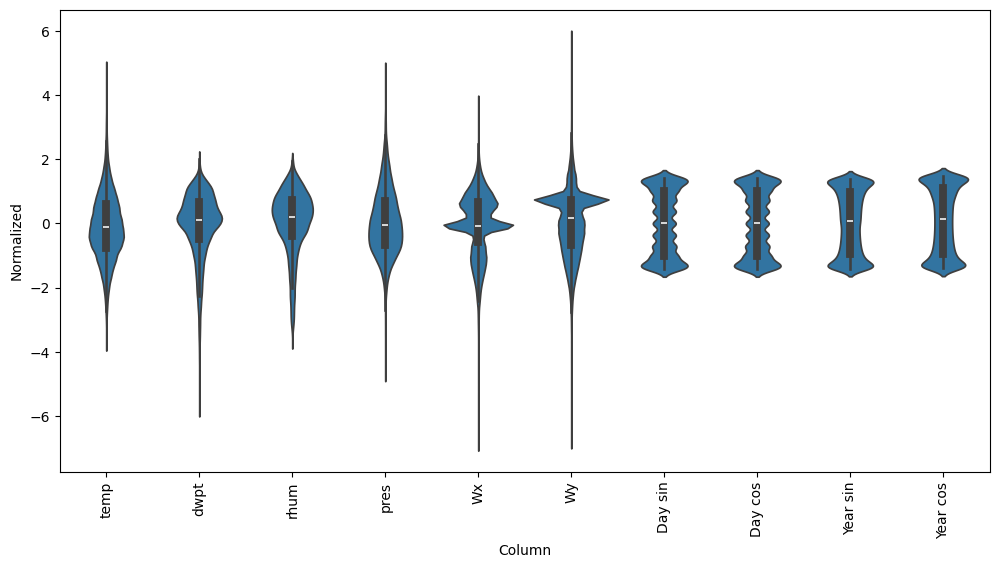

In [45]:
import seaborn as sns
import matplotlib.pyplot as plt

# Specify the target column
target_column = 'MeanPower'
# Standardize the entire DataFrame using the mean and std from the training dataset, excluding the target column
df_std = (df.drop(columns=[target_column]) - train_mean) / train_std
df_std[target_column] = df[target_column]  # Add the target column back

# Melt the DataFrame to transform it to long format for visualization
df_std_melted = df_std.drop(columns=[target_column]).melt(var_name='Column', value_name='Normalized')

# Set up the figure and axis for the violin plot
plt.figure(figsize=(12, 6))
ax = sns.violinplot(x='Column', y='Normalized', data=df_std_melted)

# Rotate x-axis labels for better readability
_ = ax.set_xticklabels(df.drop(columns=[target_column]).keys(), rotation=90)

# Show the plot
plt.show()


In [46]:
# # Standardize the entire DataFrame using the mean and std from the training dataset
# df_std = (df - train_mean) / train_std

# # Melt the DataFrame to transform it to long format for visualization
# df_std = df_std.melt(var_name='Column', value_name='Normalized')

# # Set up the figure and axis for the violin plot
# plt.figure(figsize=(12, 6))
# ax = sns.violinplot(x='Column', y='Normalized', data=df_std)

# # Rotate x-axis labels for better readability
# _ = ax.set_xticklabels(df.keys(), rotation=90)


lets plot box plot for normalized data to see the data distribution

In [47]:
# import seaborn as sns
# import matplotlib.pyplot as plt

# # Set up the figure and axis for the box plot
# plt.figure(figsize=(12, 6))
# ax = sns.boxplot(x='Column', y='Normalized', data=normalized_data_melted)

# # Rotate x-axis labels for better readability
# _ = ax.set_xticklabels(normalized_data.columns, rotation=90)

# # Show the plot
# plt.title('Box Plot of Normalized Data')
# plt.xlabel('Column')
# plt.ylabel('Normalized Value')
# plt.show()


Some features do have long tails, but there are no obvious errors they are the maximun values as we visualized before.

#5.Data windowing 1

prediction 24 hours into the future, given 24 hours of history
timestep= 60mins= 1 hour
window size 60 mins=1 day

In [48]:
class WindowGenerator():
    def __init__(self, input_width, label_width, shift,
                 train_df=train_df, val_df=val_df, test_df=test_df,
                 label_columns=None):
        # Store the raw data.
        self.train_df = train_df
        self.val_df = val_df
        self.test_df = test_df

        # Work out the label column indices.
        self.label_columns = label_columns
        if label_columns is not None:
            # Create a dictionary to map label column names to indices
            self.label_columns_indices = {name: i for i, name in enumerate(label_columns)}

        # Create a dictionary to map all column names to indices
        self.column_indices = {name: i for i, name in enumerate(train_df.columns)}

        # Work out the window parameters.
        self.input_width = input_width
        self.label_width = label_width
        self.shift = shift

        # Calculate the total window size
        self.total_window_size = input_width + shift

        # Define slices and indices for input and label windows
        self.input_slice = slice(0, input_width)
        self.input_indices = np.arange(self.total_window_size)[self.input_slice]

        self.label_start = self.total_window_size - self.label_width
        self.labels_slice = slice(self.label_start, None)
        self.label_indices = np.arange(self.total_window_size)[self.labels_slice]

    def __repr__(self):
        # Return a string representation of the class
        return '\n'.join([
            f'Total window size: {self.total_window_size}',
            f'Input indices: {self.input_indices}',
            f'Label indices: {self.label_indices}',
            f'Label column name(s): {self.label_columns}'
        ])


***window object*** 24 time steps aead prediction with 24 time steps behind

In [49]:
OUT_STEPS = 24
multi_window_baseline = WindowGenerator(
    input_width=24, label_width=24, shift=24)

multi_window = WindowGenerator(
    input_width=24, label_width=24, shift=24,
    label_columns=['MeanPower'])

multi_window

Total window size: 48
Input indices: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23]
Label indices: [24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47]
Label column name(s): ['MeanPower']

In [50]:
multi_window_baseline

Total window size: 48
Input indices: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23]
Label indices: [24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47]
Label column name(s): None

##split

In [51]:
def split_window(self, features):
  inputs = features[:, self.input_slice, :]
  labels = features[:, self.labels_slice, :]
  if self.label_columns is not None:
    labels = tf.stack(
        [labels[:, :, self.column_indices[name]] for name in self.label_columns],
        axis=-1)

  # Slicing doesn't preserve static shape information, so set the shapes
  # manually. This way the `tf.data.Datasets` are easier to inspect.
  inputs.set_shape([None, self.input_width, None])
  labels.set_shape([None, self.label_width, None])

  return inputs, labels

WindowGenerator.split_window = split_window

## 4. Create `tf.data.Dataset`s

Finally, this `make_dataset` method will take a time series DataFrame and convert it to a `tf.data.Dataset` of `(input_window, label_window)` pairs using the `tf.keras.utils.timeseries_dataset_from_array` function:

In [52]:
def make_dataset(self, data):
  data = np.array(data, dtype=np.float32)
  ds = tf.keras.utils.timeseries_dataset_from_array(
      data=data,
      targets=None,
      sequence_length=self.total_window_size,
      sequence_stride=1,
      shuffle=True,
      batch_size=32,)

  ds = ds.map(self.split_window)

  return ds

WindowGenerator.make_dataset = make_dataset

def make_dataset_visualize(self, data):
  data = np.array(data, dtype=np.float32)
  ds = tf.keras.utils.timeseries_dataset_from_array(
      data=data,
      targets=None,
      sequence_length=self.total_window_size,
      sequence_stride=24,
      shuffle=False,
      batch_size=32,)

  ds = ds.map(self.split_window)

  return ds

WindowGenerator.make_dataset_visualize = make_dataset_visualize

The `WindowGenerator` object holds training, validation, and test data.


In [53]:
@property
def train(self):
  return self.make_dataset(self.train_df)

@property
def val(self):
  return self.make_dataset(self.val_df)

@property
def test(self):
  return self.make_dataset(self.test_df)

@property
def test_visualize(self):
  return self.make_dataset_visualize(self.test_df)

@property
def example(self):
  """Get and cache an example batch of `inputs, labels` for plotting."""
  result = getattr(self, '_example', None)
  if result is None:
    # No example batch was found, so get one from the `.train` dataset
    result = next(iter(self.test))
    # And cache it for next time
    self._example = result
  return result

WindowGenerator.train = train
WindowGenerator.val = val
WindowGenerator.test = test
WindowGenerator.test_visualize = test_visualize
WindowGenerator.example = example

#**packaged training procedure function**

In [150]:
# Import TensorFlow library
import tensorflow as tf

# Custom R-squared metric
def r_squared(y_true, y_pred):
  ss_res = tf.reduce_sum(tf.square(y_true - y_pred))
  ss_tot = tf.reduce_sum(tf.square(y_true - tf.reduce_mean(y_true)))

  if ss_tot ==0:
    return tf.sqrt(tf.square(1 - ss_res / tf.reduce_sum(tf.square(y_true - tf.reduce_mean(y_true) + tf.keras.backend.epsilon()))  ))

  else:
    return tf.sqrt(tf.square(1 - ss_res / ss_tot))

# Maximum number of training epochs
MAX_EPOCHS = 200

# Function to compile and fit a neural network model
def compile_and_fit(model, window, patience=4):
    # Define early stopping callback
    early_stopping = tf.keras.callbacks.EarlyStopping(
        monitor='val_loss',     # Monitor validation loss
        patience=patience,       # Number of epochs with no improvement after which training will be stopped
        mode='min'               # Stop when the monitored metric ('val_loss') stops decreasing (minimizing)
    )
    # Compile the model
    model.compile(
        loss=tf.keras.losses.MeanSquaredError(),           # Use Mean Squared Error loss function
        optimizer=tf.keras.optimizers.Adam(),              # Use the Adam optimizer
        metrics=[
            tf.keras.metrics.MeanAbsoluteError(),
            tf.keras.metrics.RootMeanSquaredError(),
            r_squared,  # Custom R-squared metric

        ]
    )

    # Train the model
    history = model.fit(
        window.train,            # Training data
        epochs=MAX_EPOCHS,        # Maximum number of training epochs
        validation_data=window.val,  # Validation data
        callbacks=[early_stopping]   # List of callbacks, including early stopping
    )

    # Return the training history
    return history

ChatGPT  
Relevant Equations for Neural Network Training:  
1. Mean Squared Error (MSE):  
- The Mean Squared Error is a fundamental loss function for regression tasks, measuring the average squared difference between predicted $(\hat{y})$ and actual $(y)$ values.  
$$  
M S E=\frac{1}{n} \sum_{i=1}^{n}\left(y_{i}-\hat{y}_{i}\right)^{2}  
$$  
2. Root Mean Squared Error (RMSE):  
- The Root Mean Squared Error represents the square root of the mean squared differences between predicted and actual values, providing a measure of the average magnitude of errors.  
$$  
R M S E=\sqrt{M S E}  
$$  
3. R-squared (Coefficient of Determination):  
- $\mathrm{R}$-squared quantifies the proportion of variance in the dependent variable that the model explains. It is expressed as the ratio of the sum of squared residuals ( $S S_{\text {res }}$ ) to the total sum of squares ( $S S_{\text {tot }}$ ).  
$$  
R^{2}=1-\frac{S S_{\text {min }}}{S S_{\text {tot }}}  
$$  
4. Adam Optimizer:  
- The Adam optimizer adjusts model weights based on the gradient of the loss function with respect to the weights. It combines elements of both the Momentum and RMSProp optimizers.  
$$  
\begin{array}{l}  
m_{t}=\beta_{1} \cdot m_{t-1}+\left(1-\beta_{1}\right) \cdot g_{t} \\  
v_{t}=\beta_{2} \cdot v_{t-1}+\left(1-\beta_{2}\right) \cdot g_{t}^{2} \\  
\theta_{t}=\theta_{t-1}-\frac{\eta}{\sqrt{v_{t}+\epsilon}} \cdot m_{t}  
\end{array}  
$$  
  
These equations form the basis of the neural network training process, encompassing loss calculation, performance metrics, and weight optimization through the Adam optimizer.

##Plot functions

####Plot random 3 samples from the train dataset

In [55]:
def plot(self, model=None, plot_col='MeanPower', max_subplots=3):
  inputs, labels = self.example
  plt.figure(figsize=(12, 8))
  plot_col_index = self.column_indices[plot_col]
  max_n = min(max_subplots, len(inputs))
  for n in range(max_n):
    plt.subplot(max_n, 1, n+1)
    plt.ylabel(f'{plot_col} [normed]')
    plt.plot(self.input_indices, inputs[n, :, plot_col_index],
             label='Inputs', marker='.', zorder=-10)

    if self.label_columns:
      label_col_index = self.label_columns_indices.get(plot_col, None)
    else:
      label_col_index = plot_col_index

    if label_col_index is None:
      continue

    plt.scatter(self.label_indices, labels[n, :, label_col_index],
                edgecolors='k', label='Labels', c='#2ca02c', s=64)
    if model is not None:
      predictions = model(inputs)
      plt.scatter(self.label_indices, predictions[n, :, label_col_index],
                  marker='X', edgecolors='k', label='Predictions',
                  c='#ff7f0e', s=64)

    if n == 0:
      plt.legend()

  plt.xlabel('Time [h]')

WindowGenerator.plot = plot

####plot_actual_vs_predicted

In [96]:
import plotly.graph_objects as go

def plot_actual_vs_predicted_all_datetime_plotly(self, model=None, plot_col='MeanPower'):
         #datetime_values = self.test_df.index.to_numpy()

        # Get all data from the test set
        test_data = self.test_visualize
        actual_values = []
        predicted_values = []
        datetime_values = []

        for inputs, labels in test_data:

            # Convert labels to NumPy array

            label_col_index = self.label_columns_indices[plot_col]
            actual_values.append(labels[:, :, label_col_index].numpy().flatten())

            # Get the corresponding datetime values from the 'DateTime' column
            datetime_values = self.test_df.index[24:].to_numpy()

            if model is not None:
                predictions = model.predict(inputs)
                # Consider only the valid part of the last batch
                predicted_values.append(predictions[:, :len(labels), label_col_index].flatten())


        # # Concatenate and reshape the arrays
        actual_values = np.concatenate(actual_values)
        predicted_values = np.concatenate(predicted_values)

        print("Datetime Datapoints:", len(datetime_values))
        print("Actual Values Datapoints:", len(actual_values))
        print("Predicted Values Datapoints:", len(predicted_values))

        # Create a Plotly figure
        fig = go.Figure()

        # Add trace for actual values
        fig.add_trace(go.Scatter(x=datetime_values, y=actual_values,
                                mode='lines+markers', name='Actual'))

        # Add trace for predicted values if a model is provided
        if model is not None:
            fig.add_trace(go.Scatter(x=datetime_values, y=predicted_values,
                                    mode='lines+markers', name='Predicted'))

        print(predicted_values.shape)

        # Customize layout
        fig.update_layout(
            title=f'Actual vs Predicted ({plot_col})',
            xaxis_title='Time',
            yaxis_title=f'{plot_col} [normed]',
            showlegend=True
        )

        # Show the figure
        fig.show()
        IPython.display.clear_output()# Clear the IPython display



# Assign the modified function to the WindowGenerator class
WindowGenerator.plot_actual_vs_predicted_all_datetime_plotly = plot_actual_vs_predicted_all_datetime_plotly

###training loss vs validation loss

In [124]:
import matplotlib.pyplot as plt

def plot_training_history(history):

      # Plot the losses
    training_loss = history.history['loss']
    epochs = range(1, len(training_loss) + 1)
    # Create a figure with two subplots
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 10))

    # Plot training and validation loss
    ax1.plot(history.history['loss'], label='train_loss')
    ax1.plot(history.history['val_loss'], label='val_loss')
    ax1.set_title('Training and Validation Loss')
    ax1.set_xlabel('Epoch')
    ax1.set_ylabel('Loss')
    ax1.legend()

    # Plot training and validation accuracy (r_squared in your case)
    ax2.plot(history.history['r_squared'], label='train_accuracy')
    ax2.plot(history.history['val_r_squared'], label='val_accuracy')
    ax2.set_title('Training and Validation Accuracy (R-squared)')
    ax2.set_xlabel('Epoch')
    ax2.set_ylabel('Accuracy')
    ax2.legend()

    # Adjust layout to prevent overlap
    plt.tight_layout()

    # Show the plot
    plt.show()


#Baseline model (Repeat)

Since this task is to predict 24 hours into the future, given 24 hours of the past,simple approach is to repeat the previous day, assuming tomorrow will be similar:


In [58]:
multi_train_performance = {}
multi_val_performance = {}
multi_test_performance = {}
history=[]

In [59]:
multi_window.column_indices

{'temp': 0,
 'dwpt': 1,
 'rhum': 2,
 'pres': 3,
 'Wx': 4,
 'Wy': 5,
 'Day sin': 6,
 'Day cos': 7,
 'Year sin': 8,
 'Year cos': 9,
 'MeanPower': 10}

In [60]:
class RepeatBaseline(tf.keras.Model):
    def __init__(self, target_column_index):
        super(RepeatBaseline, self).__init__()
        self.target_column_index = target_column_index

    def call(self, inputs):
        return inputs[:, :, self.target_column_index: self.target_column_index + 1]
# Assuming 'MeanPower' is the 6th column (index 5) in your input data
target_column_index = 10

# Create an instance of RepeatBaseline with the specified target column index
repeat_baseline = RepeatBaseline(target_column_index)

# Compile the model
repeat_baseline.compile(
    loss=tf.keras.losses.MeanSquaredError(),
    metrics=[
        tf.keras.metrics.MeanAbsoluteError(),
        tf.keras.metrics.RootMeanSquaredError(),r_squared
        # You need to define the r_squared metric function here
    ]
)


In [61]:
print('Input shape:', multi_window.example[0].shape)
print('Output shape:', repeat_baseline(multi_window.example[0]).shape)

Input shape: (32, 24, 11)
Output shape: (32, 24, 1)


227/227 [==============================] - 1s 3ms/step - loss: 1.0287 - mean_absolute_error: 0.7943 - root_mean_squared_error: 1.0142 - r_squared: 0.1441


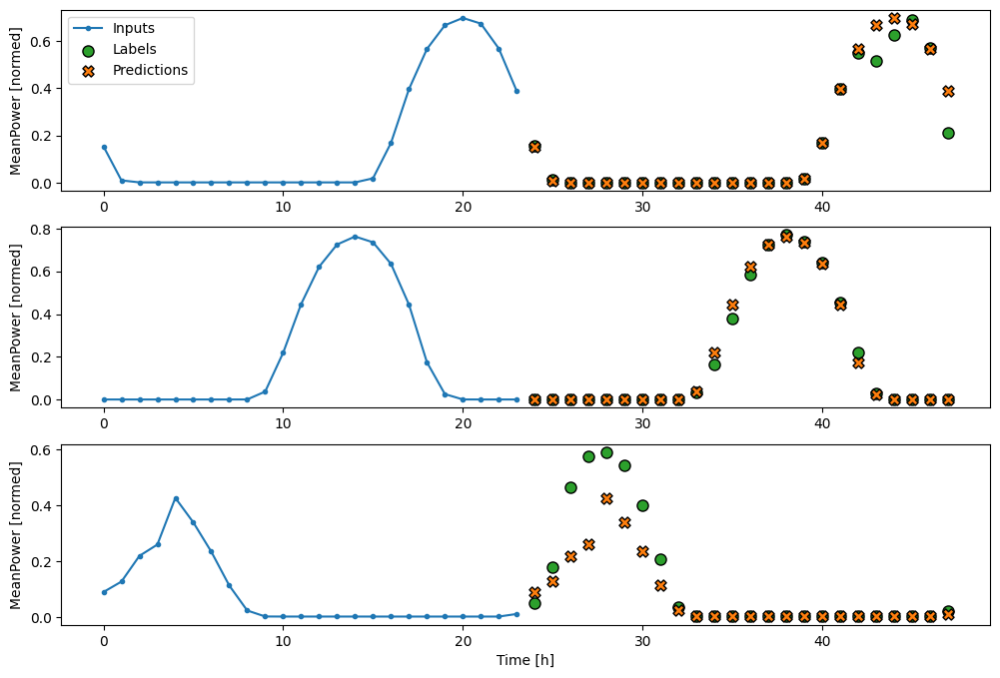

In [62]:
multi_train_performance['RepeatBaseline'] = repeat_baseline.evaluate(multi_window_baseline.train)
multi_val_performance['RepeatBaseline'] = repeat_baseline.evaluate(multi_window_baseline.val)
multi_test_performance['RepeatBaseline'] = repeat_baseline.evaluate(multi_window_baseline.test, verbose=0) #verbose=0, the evaluation is performed quietly, and no progress or result information is printed
multi_window.plot(repeat_baseline)

In [63]:
multi_window.column_indices

{'temp': 0,
 'dwpt': 1,
 'rhum': 2,
 'pres': 3,
 'Wx': 4,
 'Wy': 5,
 'Day sin': 6,
 'Day cos': 7,
 'Year sin': 8,
 'Year cos': 9,
 'MeanPower': 10}

In [97]:
multi_window.plot_actual_vs_predicted_all_datetime_plotly(model=repeat_baseline, plot_col='MeanPower')

#Neural Network Models


convolutional model with predict multiple steps(24time steps) using past 24 time steps

Experimentation:

Begin by experimenting with a range of values, such as 4, 8, 12, or 24, for CONV_WIDTH and observe how the model's performance changes.

###CNN_model

Experimentation:

Begin by experimenting with a range of values, such as 4, 8, 12, or 24, and observe how the model's performance changes.

In [151]:
# Set the convolution width
CONV_WIDTH = 12

# Create a Sequential model for the convolutional model
cnn_model = tf.keras.Sequential([
      # Lambda layer to select the last CONV_WIDTH time steps
      tf.keras.layers.Lambda(lambda x: x[:, -CONV_WIDTH:, :]),
      # Convolutional layer with ReLU activation and He initialization
      tf.keras.layers.Conv1D(256, activation='relu', kernel_size=CONV_WIDTH, kernel_initializer='he_normal'),
      # Batch Normalization layer
      tf.keras.layers.BatchNormalization(),
      # Dropout layer for regularization
      tf.keras.layers.Dropout(0.01),
      # Dense layer with linear activation and He initialization
      tf.keras.layers.Dense(OUT_STEPS, activation='relu', kernel_initializer='he_normal'),
      # Reshape layer to match the output shape
      tf.keras.layers.Reshape([OUT_STEPS, 1])
      #tf.keras.layers.Dense(units=1)
])
history = compile_and_fit(cnn_model, multi_window)# Train the convolutional model using compile_and_fit function
IPython.display.clear_output()# Clear the IPython display

# Evaluate
multi_train_performance['CNN_model'] = cnn_model.evaluate(multi_window.train) #training data performance
multi_val_performance['CNN_model'] = cnn_model.evaluate(multi_window.val) #validation data performance
multi_test_performance['CNN_model'] = cnn_model.evaluate(multi_window.test, verbose=0) #test data performanve


227/227 [==============================] - 1s 4ms/step - loss: 0.0090 - mean_absolute_error: 0.0491 - root_mean_squared_error: 0.0949 - r_squared: 0.8803


Actual vs  Predicted plot of test data

In [152]:
multi_window.plot_actual_vs_predicted_all_datetime_plotly(model=cnn_model, plot_col='MeanPower')

plot random 3 samples from test set

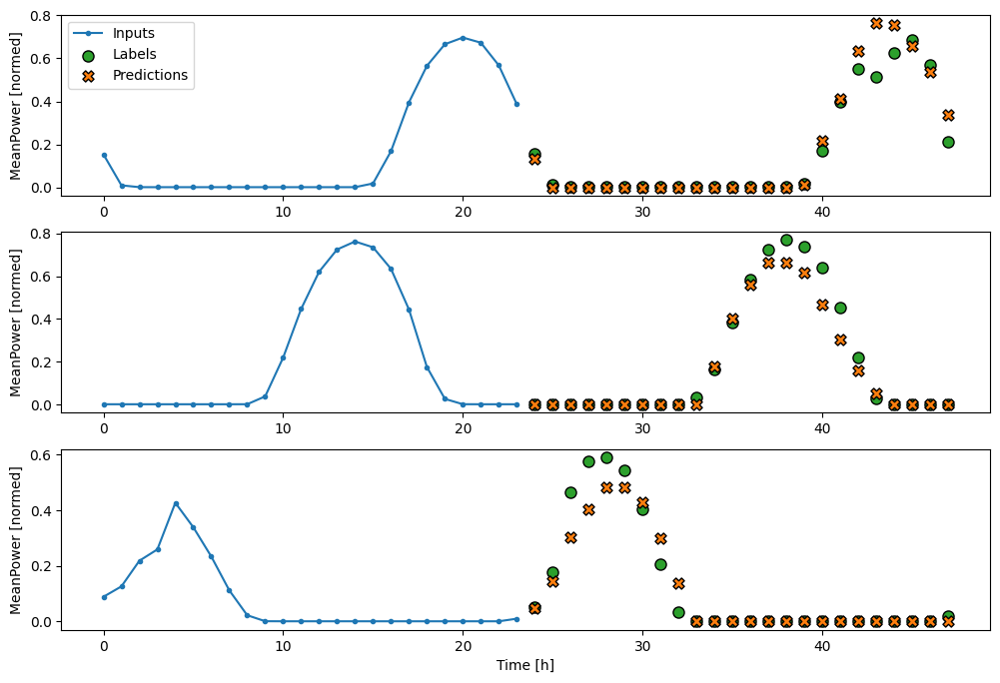

In [153]:
# Plot the performance
multi_window.plot(cnn_model)

#### training loss vs validation loss

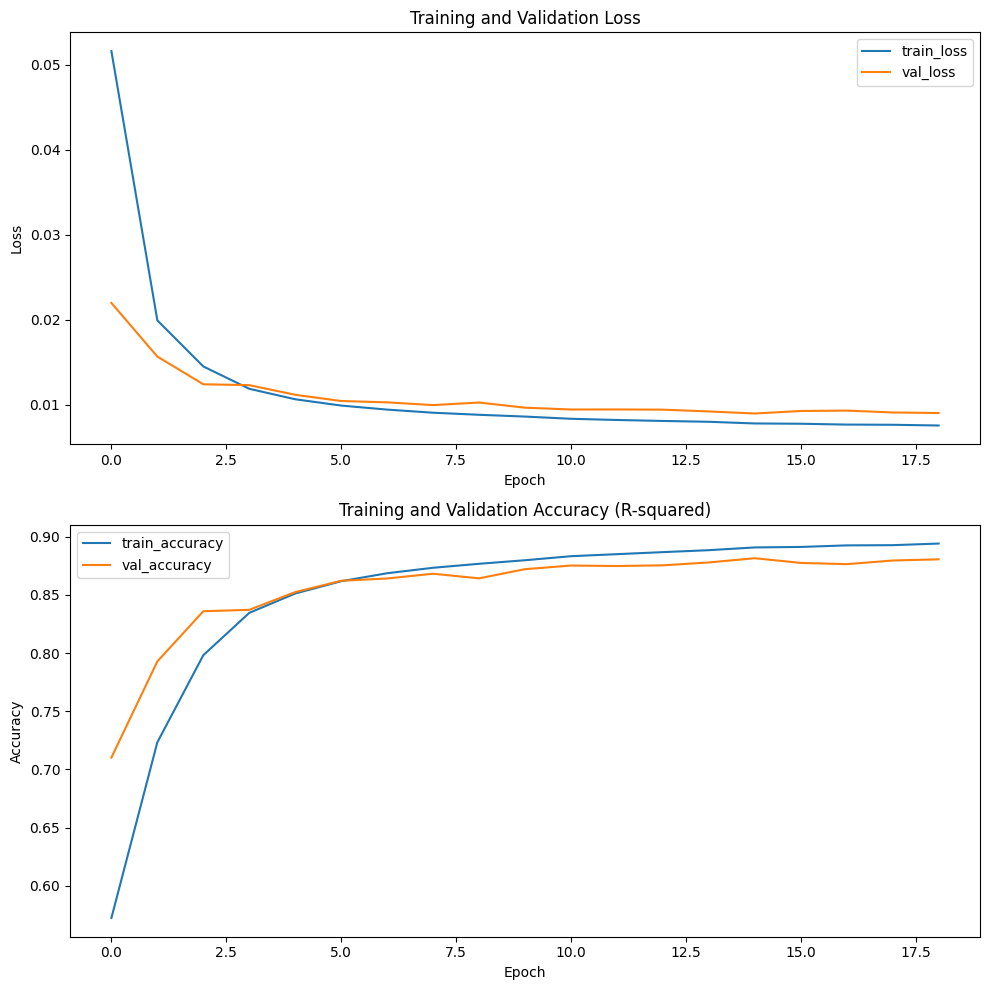

In [154]:
plot_training_history(history)

###CNN_model2

Experimentation:

Begin by experimenting with a range of values, such as 4, 8, 12, or 24, and observe how the model's performance changes.

In [175]:
# # Set the convolution width
# CONV_WIDTH = 15

# # Create a Sequential model for the convolutional model
# cnn_model_2 = tf.keras.Sequential([
#       # Shape [batch, time, features] => [batch, CONV_WIDTH, features]
#       tf.keras.layers.Lambda(lambda x: x[:, -CONV_WIDTH:, :]),
#       # Shape => [batch, 1, conv_units]
#       tf.keras.layers.Conv1D(128, activation='relu', kernel_size=(CONV_WIDTH)),
#       #tf.keras.layers.LSTM(64, activation='relu'),
#       tf.keras.layers.Dense(units=32, activation='relu'),
#       # Shape => [batch, 1, out_steps*features]
#       tf.keras.layers.Dense(OUT_STEPS*1,
#                             kernel_initializer=tf.initializers.zeros()),
#       # Shape => [batch, out_steps, features]
#       #tf.keras.layers.Dense(128, activation='relu'),  # Add another dense layer with 128 units and ReLU activation
#       #tf.keras.layers.Dense(units=32, activation='linear'),
#       #f.keras.layers.Dense(units=1),
#       tf.keras.layers.Reshape([OUT_STEPS, 1])


# ])

# history = compile_and_fit(cnn_model_2, multi_window)# Train the convolutional model using compile_and_fit function
# IPython.display.clear_output()# Clear the IPython display

# # Evaluate
# multi_train_performance['CNN_model_2'] = cnn_model_2.evaluate(multi_window.train) #training data performance
# multi_val_performance['CNN_model_2'] = cnn_model_2.evaluate(multi_window.val) #validation data performance
# multi_test_performance['CNN_model_2'] = cnn_model_2.evaluate(multi_window.test, verbose=0) #test data performanve


227/227 [==============================] - 1s 4ms/step - loss: 0.0090 - mean_absolute_error: 0.0545 - root_mean_squared_error: 0.0951 - r_squared: 0.8807


####Actual vs  Predicted for test data

In [156]:
# # Evaluate
# multi_train_performance['CNN_model_2'] = cnn_model_2.evaluate(multi_window.train) #training data performance
# multi_val_performance['CNN_model_2'] = cnn_model_2.evaluate(multi_window.val) #validation data performance
# multi_test_performance['CNN_model_2'] = cnn_model_2.evaluate(multi_window.test, verbose=0) #test data performanve

In [157]:
# multi_window.plot_actual_vs_predicted_all_datetime_plotly(model=cnn_model_2, plot_col='MeanPower')

plot random 3 samples

In [158]:
# # Plot the performance
# multi_window.plot(cnn_model_2)

training loss vs validation loss

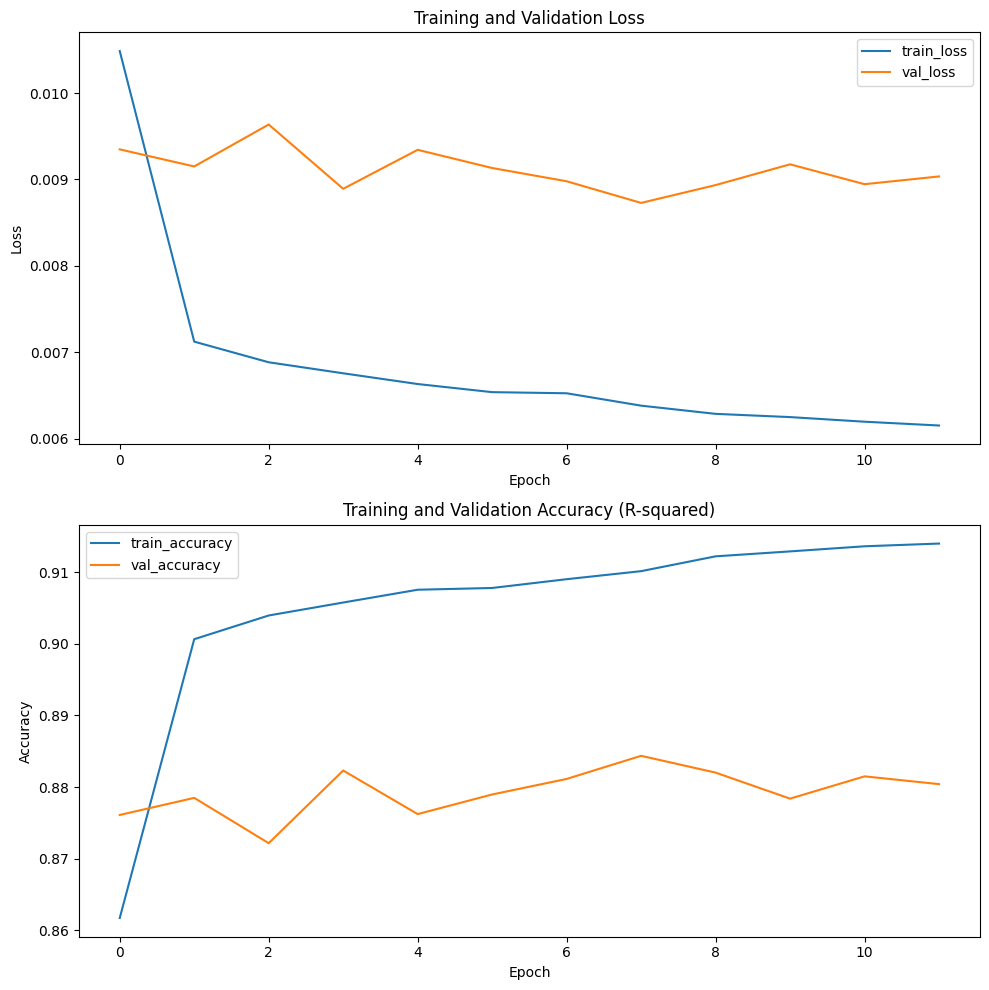

In [176]:
# plot_training_history(history)

###CNN_model3

In [160]:
# # Set the convolution width
# CONV_WIDTH = 12

# # Create a Sequential model for the convolutional model
# cnn_model_3 = tf.keras.Sequential([
#       # Lambda layer to select the last CONV_WIDTH time steps
#       tf.keras.layers.Lambda(lambda x: x[:, -CONV_WIDTH:, :]),
#       tf.keras.layers.Conv1D(128, activation='relu', kernel_size=(CONV_WIDTH),kernel_initializer='he_normal'),
#       # Convolutional layer with ReLU activation and He initialization
#       #tf.keras.layers.Dense(units=64, activation='relu'),
#       # Batch Normalization layer
#       tf.keras.layers.BatchNormalization(),
#       # Dropout layer for regularization
#       tf.keras.layers.Dropout(0.05),
#       # Dense layer with linear activation and He initialization
#       tf.keras.layers.Dense(OUT_STEPS*1, activation='relu', kernel_initializer='he_normal'),
#       # Reshape layer to match the output shape
#       tf.keras.layers.Reshape([OUT_STEPS, 1])
# ])

# history = compile_and_fit(cnn_model_3, multi_window)# Train the convolutional model using compile_and_fit function
# IPython.display.clear_output()# Clear the IPython display

# # Evaluate
# multi_train_performance['Cnn_model_3'] = cnn_model_3.evaluate(multi_window.train) #training data performance
# multi_val_performance['Cnn_model_3'] = cnn_model_3.evaluate(multi_window.val)
# multi_test_performance['Cnn_model_3'] = cnn_model_3.evaluate(multi_window.test, verbose=0)


In [161]:
# multi_window.plot_actual_vs_predicted_all_datetime_plotly(model=cnn_model_3, plot_col='MeanPower')

 training loss vs validation loss

In [162]:
# plot_training_history(history)

###LSTM

In [163]:
LSTM_model = tf.keras.Sequential([
    # Shape [batch, time, features] => [batch, lstm_units].
    # Adding more `lstm_units` just overfits more quickly.
    tf.keras.layers.LSTM(128, return_sequences=False),
    # Shape => [batch, out_steps*features].
    tf.keras.layers.Dense(OUT_STEPS*1,
                          kernel_initializer=tf.initializers.zeros()),
    # Shape => [batch, out_steps, features].
    tf.keras.layers.Reshape([OUT_STEPS,1 ])
])

history = compile_and_fit(LSTM_model, multi_window)

IPython.display.clear_output()
multi_train_performance['LSTM_model'] = LSTM_model.evaluate(multi_window.train) #training data performance
multi_val_performance['LSTM_model'] = LSTM_model.evaluate(multi_window.val)
multi_test_performance['LSTM_model'] = LSTM_model.evaluate(multi_window.test, verbose=0)


227/227 [==============================] - 4s 15ms/step - loss: 0.0106 - mean_absolute_error: 0.0543 - root_mean_squared_error: 0.1029 - r_squared: 0.8596


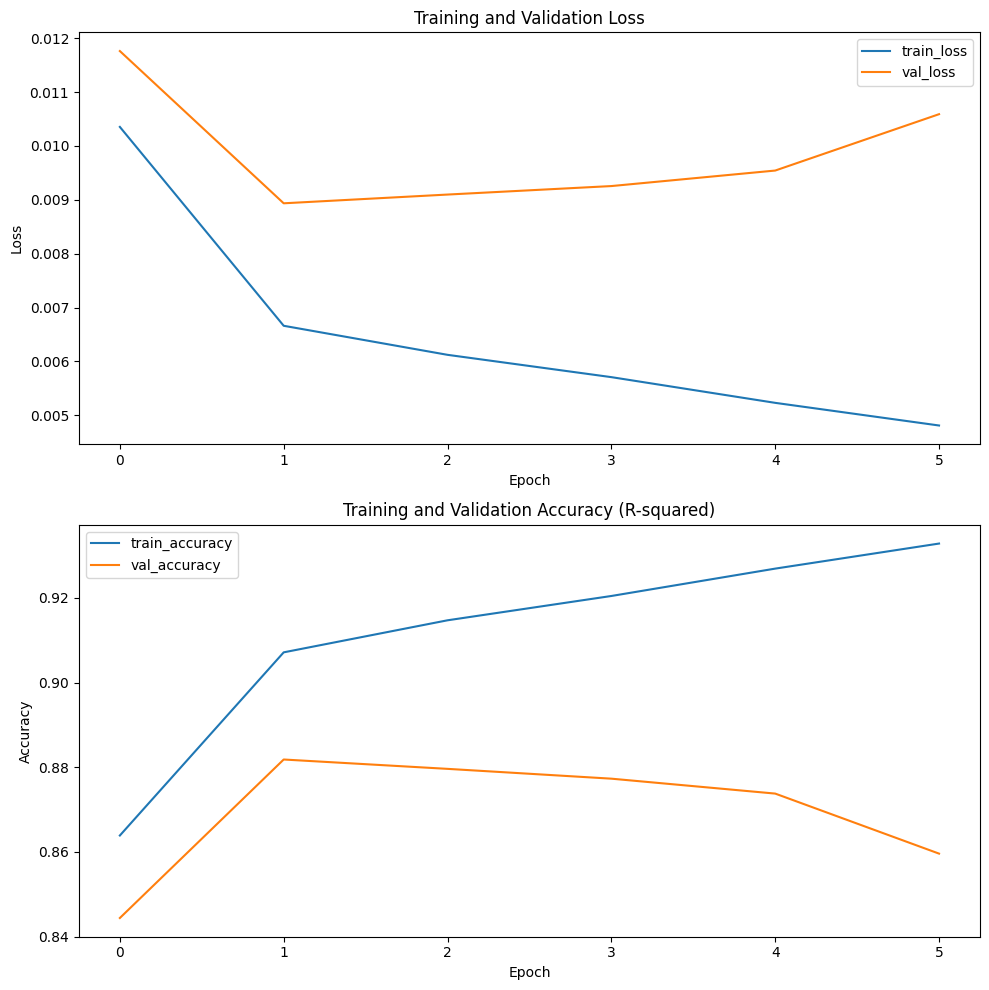

In [164]:
plot_training_history(history)

In [165]:
# # Install Keras Tuner
# !pip install keras-tuner

# Performance

There are clearly diminishing returns as a function of model complexity on this problem:

In [177]:
#x = np.arange(len(multi_performance))
multi_train_performance


{'RepeatBaseline': [1.0413830280303955,
  0.7954411506652832,
  1.0204814672470093,
  0.13633602857589722],
 'CNN_model': [0.006445728708058596,
  0.040914468467235565,
  0.08028528839349747,
  0.9101305603981018],
 'LSTM_model': [0.0051598213613033295,
  0.03886902704834938,
  0.07183186709880829,
  0.9279612302780151],
 'CNN_model_2': [0.006321764085441828,
  0.046524353325366974,
  0.07950949668884277,
  0.911958634853363]}

In [178]:
multi_val_performance

{'RepeatBaseline': [1.0286998748779297,
  0.7942760586738586,
  1.0142487287521362,
  0.14413350820541382],
 'CNN_model': [0.009012785740196705,
  0.04907999560236931,
  0.09493569284677505,
  0.8803493976593018],
 'LSTM_model': [0.010589215904474258,
  0.054314613342285156,
  0.10290389508008957,
  0.8595718145370483],
 'CNN_model_2': [0.009035245515406132,
  0.05447796732187271,
  0.09505390375852585,
  0.8806685209274292]}

In [179]:
multi_test_performance

{'RepeatBaseline': [1.149170994758606,
  0.8325400352478027,
  1.0719940662384033,
  0.08714953064918518],
 'CNN_model': [0.005509619601070881,
  0.03576686978340149,
  0.07422681897878647,
  0.8961384296417236],
 'LSTM_model': [0.0055241212248802185,
  0.040722671896219254,
  0.07432443648576736,
  0.8953145146369934],
 'CNN_model_2': [0.005526640452444553,
  0.0421660877764225,
  0.07434139400720596,
  0.8961994051933289]}

In [180]:
x = np.arange(len(multi_train_performance))
x

array([0, 1, 2, 3])

###Loss comparision

Model Training:

* Lower Loss: A model with a lower loss on the training set generally indicates that the model is learning well from the training data.
Overfitting:

* Training Loss vs. Validation Loss: If there is a significant difference between the training loss and the validation loss, it might indicate overfitting. The model may be too complex and is fitting noise in the training data.

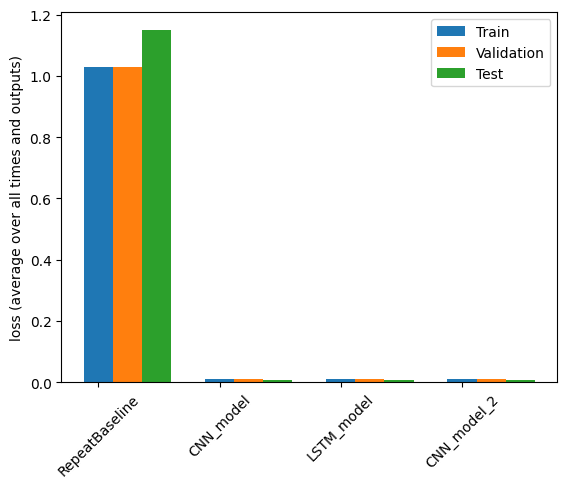

In [181]:
import numpy as np
import matplotlib.pyplot as plt

x = np.arange(len(multi_test_performance))
width = 0.24

train_loss = [v[0] for v in multi_train_performance.values()]
val_loss = [v[0] for v in multi_val_performance.values()]
test_loss = [v[0] for v in multi_test_performance.values()]

plt.bar(x  , val_loss, width, label='Train')
plt.bar(x +width , val_loss, width, label='Validation')
plt.bar(x +(2*width), test_loss, width, label='Test')
plt.xticks(ticks=x, labels=multi_test_performance.keys(), rotation=45)
plt.ylabel(f'loss (average over all times and outputs)')
_ = plt.legend()
plt.show()

The metrics for the multi-output models in the first half of this tutorial show the performance averaged across all output features. These performances are similar but also averaged across output time steps.

###MEA comparision

* Prediction Accuracy:

Lower MAE: A model with a lower MAE indicates better accuracy in predicting the target variable. MAE is a measure of the average absolute difference between predicted and actual values.
Interpretability:

* Easier Interpretation: MAE is easier to interpret than squared loss functions. It gives the average magnitude of errors, which can be more intuitive.
Robustness to Outliers:

* Less Sensitive to Outliers: MAE is less sensitive to outliers compared to Mean Squared Error (MSE). If your data contains outliers, MAE might provide a more robust evaluation metric.

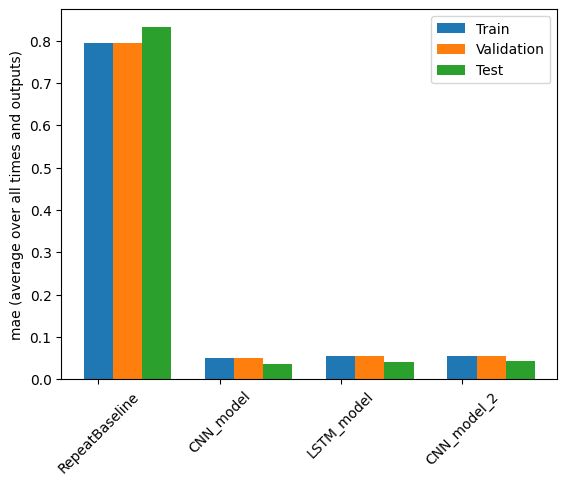

In [182]:
import numpy as np
import matplotlib.pyplot as plt

x = np.arange(len(multi_test_performance))
width = 0.24

train_loss = [v[1] for v in multi_train_performance.values()]
val_loss = [v[1] for v in multi_val_performance.values()]
test_loss = [v[1] for v in multi_test_performance.values()]

plt.bar(x  , val_loss, width, label='Train')
plt.bar(x +width , val_loss, width, label='Validation')
plt.bar(x +(2*width), test_loss, width, label='Test')
plt.xticks(ticks=x, labels=multi_test_performance.keys(), rotation=45)
plt.ylabel(f'mae (average over all times and outputs)')
_ = plt.legend()
plt.show()

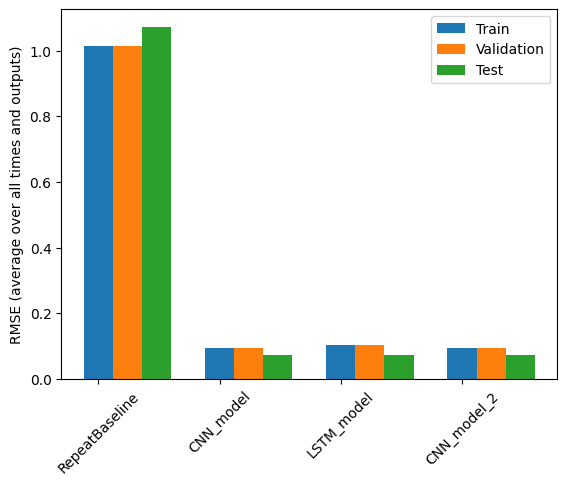

In [183]:
import numpy as np
import matplotlib.pyplot as plt

x = np.arange(len(multi_test_performance))
width = 0.24

train_loss = [v[2] for v in multi_train_performance.values()]
val_loss = [v[2] for v in multi_val_performance.values()]
test_loss = [v[2] for v in multi_test_performance.values()]

plt.bar(x  , val_loss, width, label='Train')
plt.bar(x +width , val_loss, width, label='Validation')
plt.bar(x +(2*width), test_loss, width, label='Test')
plt.xticks(ticks=x, labels=multi_test_performance.keys(), rotation=45)
plt.ylabel(f'RMSE (average over all times and outputs)')
_ = plt.legend()
plt.show()

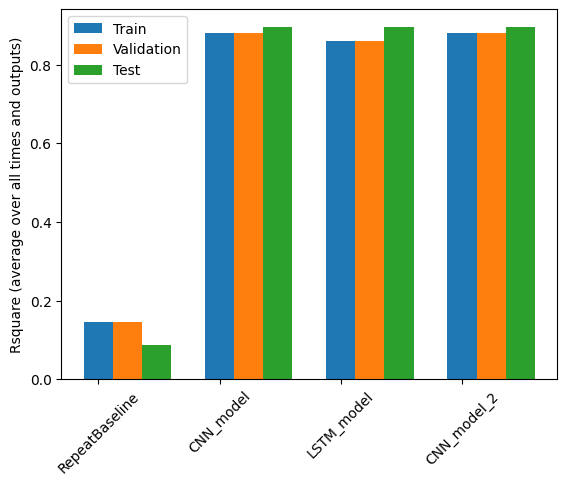

In [184]:
import numpy as np
import matplotlib.pyplot as plt

x = np.arange(len(multi_test_performance))
width = 0.24

train_loss = [v[3] for v in multi_train_performance.values()]
val_loss = [v[3] for v in multi_val_performance.values()]
test_loss = [v[3] for v in multi_test_performance.values()]

plt.bar(x  , val_loss, width, label='Train')
plt.bar(x +width , val_loss, width, label='Validation')
plt.bar(x +(2*width), test_loss, width, label='Test')
plt.xticks(ticks=x, labels=multi_test_performance.keys(), rotation=45)
plt.ylabel(f'Rsquare (average over all times and outputs)')
_ = plt.legend()
plt.show()

In [185]:
metric_names = ['loss', 'mean_absolute_error', 'root_mean_squared_error', 'r_squared']

# Convert the array to a DataFrame
df_test_performance = pd.DataFrame(multi_test_performance,index=metric_names)

# Print the DataFrame
df_test_performance.transpose()

,loss,mean_absolute_error,root_mean_squared_error,r_squared
RepeatBaseline,1.149171,0.832540,1.071994,0.087150
CNN_model,0.005510,0.035767,0.074227,0.896138
LSTM_model,0.005524,0.040723,0.074324,0.895315
CNN_model_2,0.005527,0.042166,0.074341,0.896199


#PLots best line fit actual vs predicted

###with angle

In [107]:
import plotly.graph_objects as go
import numpy as np
import math

def plot_actual_vs_predicted_with_line_test_plotly(self, model, plot_col='MeanPower'):

        # Get all data from the test set
        test_data = self.test_visualize
        actual_values = []
        predicted_values = []


        for inputs, labels in test_data:

            # Convert labels to NumPy array

            label_col_index = self.label_columns_indices[plot_col]
            actual_values.append(labels[:, :, label_col_index].numpy().flatten())

            if model is not None:
                predictions = model.predict(inputs)
                # Consider only the valid part of the last batch
                predicted_values.append(predictions[:, :, label_col_index].flatten())

        print("Actual Values Datapoints:", len(actual_values))
        print("Predicted Values Datapoints:", len(predicted_values))

        # # Concatenate and reshape the arrays
        actual_values = np.concatenate(actual_values)
        predicted_values = np.concatenate(predicted_values)

        print("Actual Values Datapoints:", len(actual_values))
        print("Predicted Values Datapoints:", len(predicted_values))

        # Calculate the regression line
        coefficients = np.polyfit(actual_values, predicted_values, 1)
        line = np.polyval(coefficients, actual_values)

        # Calculate the angle of the line
        angle_radians = math.atan2(coefficients[0], 1)
        angle_degrees = math.degrees(angle_radians)

        # Create a Plotly figure
        fig = go.Figure()

        # Add traces for actual vs predicted values
        fig.add_trace(go.Scatter(x=actual_values,
                                y=predicted_values,
                                mode='markers',
                                marker=dict(color='blue', size=8, opacity=0.7),
                                name='Actual vs Predicted'))

        # Add the fitted line
        fig.add_trace(go.Scatter(x=actual_values,
                                y=line,
                                mode='lines',
                                line=dict(color='red', width=2),
                                name=f'Fitted Line (Angle: {angle_degrees:.2f} degrees)'))

        # Customize layout
        fig.update_layout(
            title=f'Actual vs Predicted with Best Fit Line ({plot_col})',
            xaxis_title='Actual',
            yaxis_title='Predicted',
            showlegend=True
        )

        IPython.display.clear_output()# Clear the IPython display
        # Show the figure
        fig.show()

# Assign the modified function to the WindowGenerator class
WindowGenerator.plot_actual_vs_predicted_with_line_test_plotly = plot_actual_vs_predicted_with_line_test_plotly
# Assuming you have a WindowGenerator instance named 'window' and a trained model named 'model'
multi_window.plot_actual_vs_predicted_with_line_test_plotly(model=cnn_model, plot_col='MeanPower')
